In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

In [2]:
%pylab inline
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

################################################################################

from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import glob
import cv2
import os
from datetime import datetime

################################################################################

import tensorflow.compat.v2 as tf
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.python.keras.losses import BinaryCrossentropy
from tensorflow.keras.applications.vgg16 import VGG16
from segmentation_models.losses import jaccard_loss, dice_loss, categorical_focal_loss, categorical_focal_jaccard_loss, categorical_focal_dice_loss

################################################################################
try :
    import import_ipynb
except :
    !pip install import-ipynb
    import import_ipynb
from Brice_KENGNI_ZANGUIM_2_1_script_functions_25_10_2022 import *

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib
Segmentation Models: using `keras` framework.
importing Jupyter notebook from Brice_KENGNI_ZANGUIM_2_1_script_functions_25_10_2022.ipynb


In [3]:
config = tf.compat.v1.ConfigProto( device_count = { 'GPU': 5 , 'CPU': 1 } )
sess = tf.compat.v1.Session( config = config )
keras.backend.set_session( sess )

In [4]:
tf.config.list_physical_devices("GPU")

[]

In [5]:
tf.__version__

'2.9.1'

In [6]:
keras.__version__

'2.9.0'

In [7]:
pd.__version__

'1.4.4'

In [8]:
np.__version__

'1.21.5'

In [9]:
model_name = "Transfert_learning_UNET+augmentation"

# <strong> I - Acquisition des données à utiliserMaxNLocator

- ###  <strong> Chemin d'accès aux fichiers images et aux masks </strong>

In [10]:
chemin_image = os.getcwd()+"/datas/contraste/" 
chemin_masque_labelIds = os.getcwd()+"/datas/masque_labelIds/" 

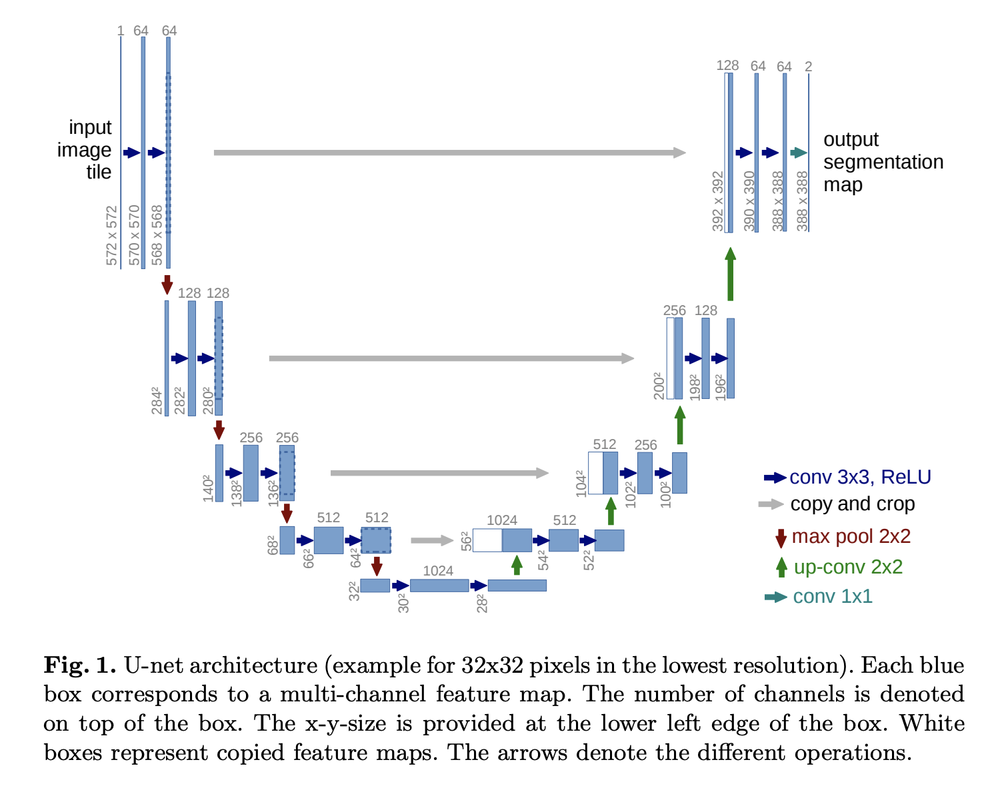

# <strong> II - Construction du modèle

- ###  <strong> definition </strong>

In [11]:
# Modèle UNET préentrainé sur Imagenet avec une couche de compression de type VGG16
def TL_unet_model(input_shape, Canaux_de_sortie, by = "seg_model"):

    if by =="build" :
        base_VGG = VGG16(include_top = False, 
                       weights = "imagenet", 
                       input_shape = input_shape)

        # On interdit l'entrainement des couche de convolution du modèle VGG16
        # Uniquement les paramètres de la couche de décodage seront entrainés
        for layer in base_VGG.layers: 
            layer.trainable = False

        # the bridge (exclude the last maxpooling layer in VGG16) 
        bridge = base_VGG.get_layer("block5_conv3").output
        #print(bridge.shape)

        # Décodeur
        up1 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(bridge)
        #print(up1.shape)
        concat_1 = concatenate([up1, base_VGG.get_layer("block4_conv3").output], axis=3)
        conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(concat_1)
        conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv6)

        up2 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv6)
        #print(up2.shape)
        concat_2 = concatenate([up2, base_VGG.get_layer("block3_conv3").output], axis=3)
        conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(concat_2)
        conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv7)

        up3 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv7)
        #print(up3.shape)
        concat_3 = concatenate([up3, base_VGG.get_layer("block2_conv2").output], axis=3)
        conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(concat_3)
        conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv8)

        up4 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv8)
        #print(up4.shape)
        concat_4 = concatenate([up4, base_VGG.get_layer("block1_conv2").output], axis=3)
        conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(concat_4)
        conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv9)

        conv10 = Conv2D(Canaux_de_sortie, (1, 1), activation='softmax')(conv9)
        #print(conv10.shape)

        model = Model( base_VGG.input, conv10 )
    elif by == "seg_model" :
        from segmentation_models import Unet
        
        model = Unet( 
                backbone_name='vgg16',
                input_shape= input_shape,
                classes= Canaux_de_sortie,
                activation='softmax',
                weights=None,
                encoder_weights='imagenet',
                encoder_freeze=True,
                encoder_features='default',
                decoder_block_type='upsampling',
                decoder_filters=(256, 128, 64, 32, 16),
                decoder_use_batchnorm=True,
                
                )
        
    model.summary()
    return model

# <strong> A - Sans augmentation de données avec fonction perte de type jaccard_loss

In [12]:
#resolution des images et masques
aug_1 = True
perte_1 = "jaccard_loss"
img_res = (128,256,3)

In [13]:
model_1 = TL_unet_model( img_res , 8)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 128, 256, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 128, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                             

In [14]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_1.compile(optimizer = Adam(lr = 2.e-2), 
                loss = jaccard_loss , 
                metrics = [ ARI_score, mean_IoU, dice_coeff, Tversky_coef ],
                run_eagerly=True
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_1 = f"models/{model_name}_Loss={perte_1}_aug={aug_1}_/cp.ckpt"
checkpoint_dir_1 = os.path.dirname(checkpoint_path_1)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.85)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_1 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_1,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq=125
                                                  )
early_stopping_1 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=10,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_1 = False

In [15]:
if  charger_les_poids_1 :
    model_1.load_weights(checkpoint_path_1)
    
history_1 = model_1.fit_generator( 
    generator = MyImagesGenerator(chemin_image, chemin_masque_labelIds,25, True, augmentation=aug_1, taille_des_donnees= 10, target_size=img_res),
    validation_data = MyImagesGenerator(chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_1, taille_des_donnees= 4, target_size=img_res),
    epochs= 450,
    max_queue_size=12,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_1 , early_stopping_1] ,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_1.save(checkpoint_dir_1+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")


Epoch 1/450
1/1 [==============================] - 54s 54s/step - loss: 0.9503 - ARI_score: 2.0152 - mean_IoU: 0.0598 - dice_coeff: 0.1129 - Tversky_coef: 0.2011 - val_loss: 0.9881 - val_ARI_score: 0.2406 - val_mean_IoU: 0.0489 - val_dice_coeff: 0.0932 - val_Tversky_coef: 0.1992 - lr: 0.0200
Epoch 2/450
1/1 [==============================] - 45s 45s/step - loss: 0.9304 - ARI_score: 2.0248 - mean_IoU: 0.1049 - dice_coeff: 0.1899 - Tversky_coef: 0.2082 - val_loss: 0.9765 - val_ARI_score: -2.8042 - val_mean_IoU: 0.0655 - val_dice_coeff: 0.1229 - val_Tversky_coef: 0.2018 - lr: 0.0200
Epoch 3/450
1/1 [==============================] - 43s 43s/step - loss: 0.8932 - ARI_score: -3.3454 - mean_IoU: 0.1995 - dice_coeff: 0.3327 - Tversky_coef: 0.2212 - val_loss: 0.9879 - val_ARI_score: -1.2267 - val_mean_IoU: 0.0508 - val_dice_coeff: 0.0967 - val_Tversky_coef: 0.1995 - lr: 0.0200
Epoch 4/450
1/1 [==============================] - 43s 43s/step - loss: 0.8655 - ARI_score: -0.9439 - mean_IoU: 0.2852

In [16]:
result_1  = pd.DataFrame( history_1.history )
result_1.drop(["lr"], axis=1, inplace=True)
result_1["modèle"] = [model_name for _ in range( result_1.shape[0])]
result_1["Loss"] = [perte_1 for _ in range( result_1.shape[0])]
result_1["Augmentation"] = [aug_1 for _ in range( result_1.shape[0])]
result_1.to_csv( f"{model_name}_loss={perte_1}_augment={aug_1}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index = False )
result_1

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.950293,2.015193,0.059805,0.112859,0.201068,0.988124,0.240601,0.048902,0.093243,0.199208,Transfert_learning_UNET+augmentation,jaccard_loss,True
1,0.930387,2.024807,0.104894,0.189871,0.208192,0.976486,-2.804169,0.065501,0.122947,0.201833,Transfert_learning_UNET+augmentation,jaccard_loss,True
2,0.893230,-3.345422,0.199546,0.332703,0.221175,0.987923,-1.226683,0.050793,0.096676,0.199514,Transfert_learning_UNET+augmentation,jaccard_loss,True
3,0.865532,-0.943889,0.285192,0.443812,0.230792,0.987999,-1.516148,0.050234,0.095661,0.199419,Transfert_learning_UNET+augmentation,jaccard_loss,True
4,0.817774,1.087828,0.357913,0.527151,0.238060,0.974091,-0.199284,0.057577,0.108885,0.200590,Transfert_learning_UNET+augmentation,jaccard_loss,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
92,0.328785,3.998986,0.761994,0.864922,0.267428,0.694616,0.738432,0.456499,0.626844,0.246369,Transfert_learning_UNET+augmentation,jaccard_loss,True
93,0.328503,-17.223911,0.765963,0.867473,0.267657,0.703617,-2.107353,0.446156,0.617023,0.245484,Transfert_learning_UNET+augmentation,jaccard_loss,True
94,0.336647,-2.214058,0.758506,0.862671,0.267234,0.697529,-0.474699,0.449934,0.620627,0.245811,Transfert_learning_UNET+augmentation,jaccard_loss,True
95,0.337691,-0.105916,0.764498,0.866533,0.267569,0.729736,-2.068480,0.411018,0.582584,0.242461,Transfert_learning_UNET+augmentation,jaccard_loss,True


In [17]:
start = 2

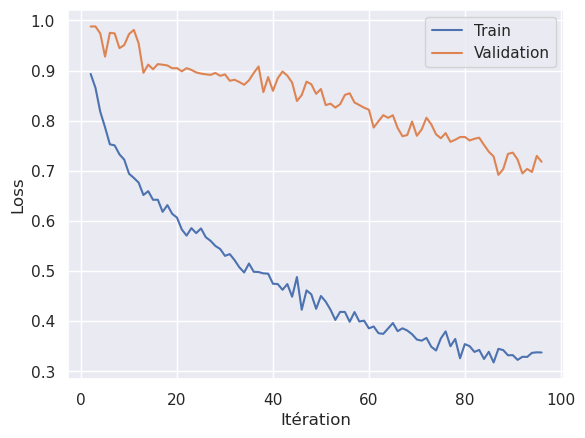

In [18]:
plt.plot(result_1.index[start:], result_1["loss"][start:])
plt.plot(result_1.index[start:], result_1["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


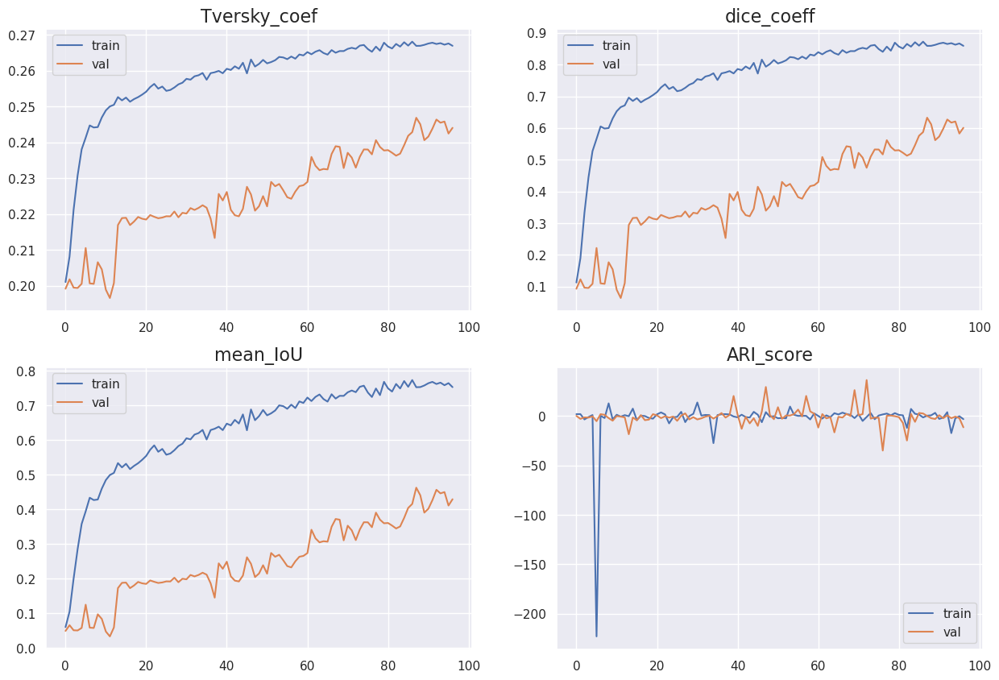

In [19]:
afficher_les_metriques( result_1 )

In [20]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_1, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [21]:
img.shape

(50, 128, 256, 3)

In [22]:
mask.shape

(50, 128, 256, 8)

In [23]:
mask_pred = model_1.predict(img)

2/2 [==============================] - 5s 2s/step


In [24]:
mask_pred.shape

(50, 128, 256, 8)

In [25]:
transformer = Mask_To_8_Groups( )

In [26]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred ]

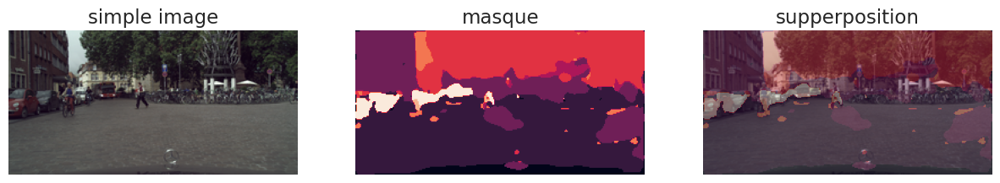

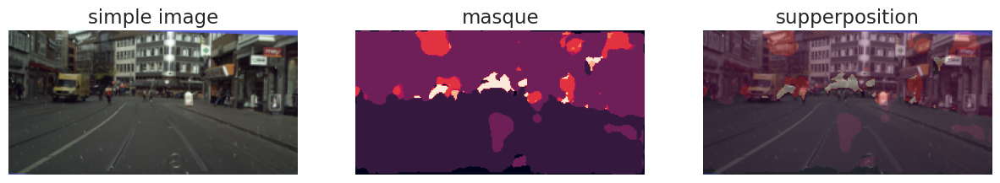

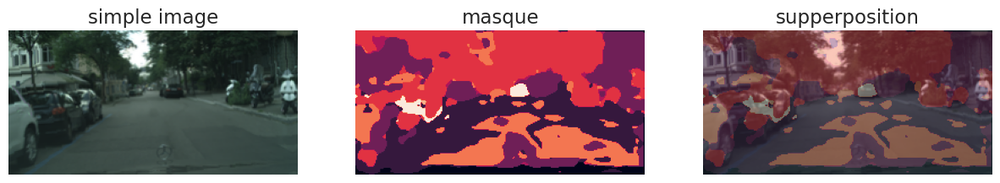

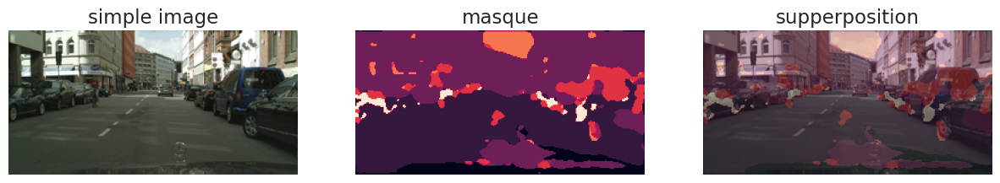

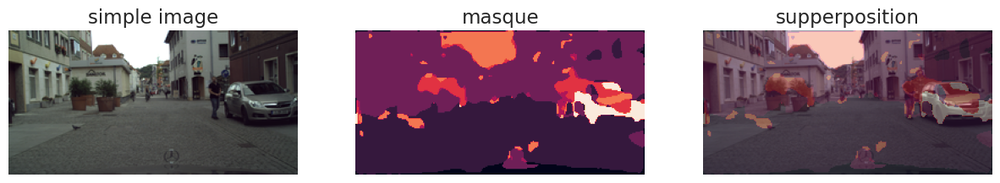

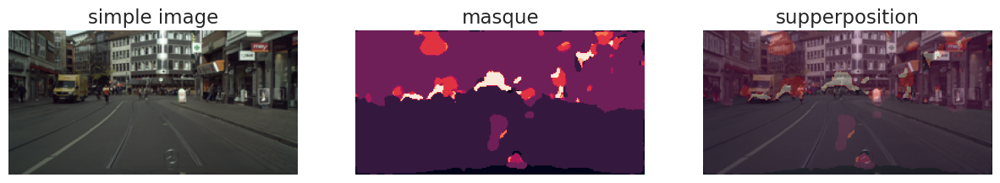

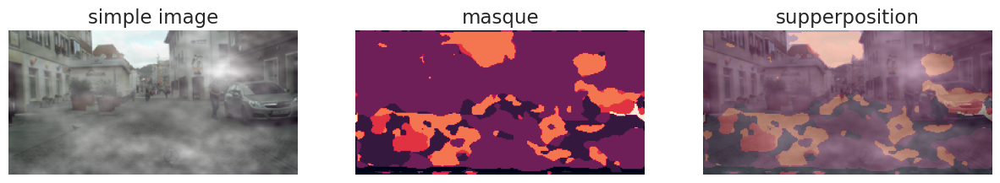

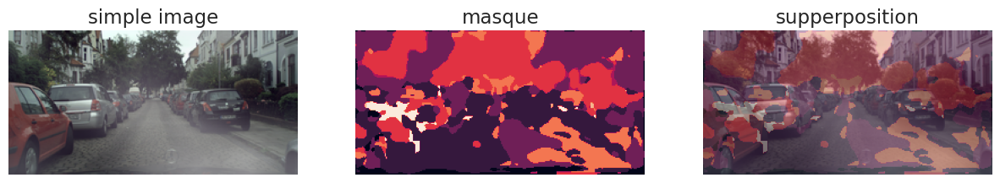

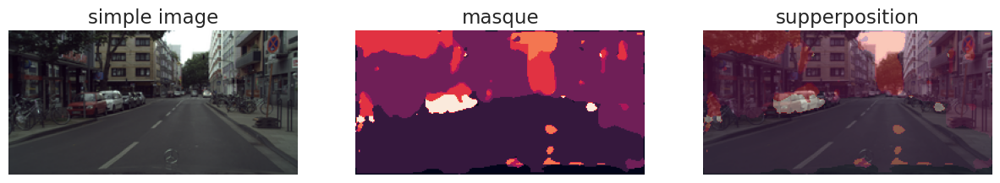

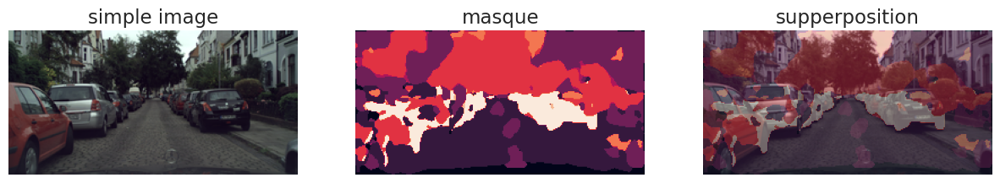

In [27]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

# <strong> B - Sans augmentation de données et fonction perte de type dice_loss

In [28]:
#resolution des images et masques
aug_2 = True
perte_2 = "dice_loss"
img_res = (128,256,3)

In [29]:
model_2 = TL_unet_model( img_res , 8)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 128, 256, 64  1792        ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 128, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

In [30]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_2.compile(optimizer = Adam(lr = 2.e-2),
                loss = dice_loss ,
                metrics = [ARI_score, mean_IoU, dice_coeff, Tversky_coef ],
                run_eagerly=True
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_2 = f"models/{model_name}_Loss={perte_2}_aug={aug_2}_/cp.ckpt"
checkpoint_dir_2 = os.path.dirname(checkpoint_path_2)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.85)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_2 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_2,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq = 125
                                                  )
early_stopping_2 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=10,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_2 = False

In [31]:
if charger_les_poids_2 : 
    model_2.load_weights(checkpoint_path_2)
    

history_2 = model_2.fit_generator( 
    generator= MyImagesGenerator(chemin_image, chemin_masque_labelIds,25, True, augmentation=aug_2, taille_des_donnees= 10, target_size=img_res),
    validation_data= MyImagesGenerator(chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_2, taille_des_donnees= 4, target_size=img_res),
    epochs=450,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_2, early_stopping_2 ],
    max_queue_size=12,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_2.save(checkpoint_dir_2+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")

Epoch 1/450
1/1 [==============================] - 24s 24s/step - loss: 0.8872 - ARI_score: 2.0175 - mean_IoU: 0.0598 - dice_coeff: 0.1128 - Tversky_coef: 0.2008 - val_loss: 0.8370 - val_ARI_score: 0.5362 - val_mean_IoU: 0.0887 - val_dice_coeff: 0.1630 - val_Tversky_coef: 0.2055 - lr: 0.0200
Epoch 2/450
1/1 [==============================] - 23s 23s/step - loss: 0.7981 - ARI_score: 1.8757 - mean_IoU: 0.1123 - dice_coeff: 0.2019 - Tversky_coef: 0.2091 - val_loss: 0.8393 - val_ARI_score: -0.5239 - val_mean_IoU: 0.0874 - val_dice_coeff: 0.1607 - val_Tversky_coef: 0.2053 - lr: 0.0200
Epoch 3/450
1/1 [==============================] - 23s 23s/step - loss: 0.6216 - ARI_score: 1.9519 - mean_IoU: 0.2334 - dice_coeff: 0.3784 - Tversky_coef: 0.2248 - val_loss: 0.8367 - val_ARI_score: -24.4187 - val_mean_IoU: 0.0889 - val_dice_coeff: 0.1633 - val_Tversky_coef: 0.2055 - lr: 0.0200
Epoch 4/450
1/1 [==============================] - 23s 23s/step - loss: 0.5309 - ARI_score: 2.0221 - mean_IoU: 0.3064 

In [32]:
result_2  = pd.DataFrame( history_2.history )
result_2.drop(["lr"], axis = 1, inplace = True)
result_2["modèle"] = [model_name for _ in range( result_2.shape[0])]
result_2["Loss"] = [perte_2 for _ in range( result_2.shape[0])]
result_2["Augmentation"] = [aug_2 for _ in range( result_2.shape[0])]
result_2.to_csv(f"{model_name}_loss={perte_2}_augment={aug_2}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index=False)
result_2

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.887224,2.017462,0.059758,0.112776,0.200775,0.837033,0.536193,0.088713,0.162967,0.205505,Transfert_learning_UNET+augmentation,dice_loss,True
1,0.798147,1.875660,0.112256,0.201853,0.209100,0.839273,-0.523879,0.087387,0.160727,0.205309,Transfert_learning_UNET+augmentation,dice_loss,True
2,0.621592,1.951933,0.233356,0.378408,0.224844,0.836670,-24.418707,0.088928,0.163330,0.205538,Transfert_learning_UNET+augmentation,dice_loss,True
3,0.530910,2.022096,0.306413,0.469090,0.232440,0.791313,-0.839790,0.116500,0.208687,0.209546,Transfert_learning_UNET+augmentation,dice_loss,True
4,0.474861,2.012652,0.356061,0.525139,0.237387,0.793236,0.026590,0.115302,0.206764,0.209374,Transfert_learning_UNET+augmentation,dice_loss,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
63,0.373036,4.234542,0.456626,0.626964,0.246066,0.476578,-6.243614,0.354483,0.523422,0.237347,Transfert_learning_UNET+augmentation,dice_loss,True
64,0.363892,1.781201,0.466391,0.636108,0.246872,0.489920,-22.529434,0.342354,0.510080,0.236170,Transfert_learning_UNET+augmentation,dice_loss,True
65,0.373955,-0.250063,0.455651,0.626045,0.245989,0.491262,2.631131,0.341146,0.508738,0.236053,Transfert_learning_UNET+augmentation,dice_loss,True
66,0.365233,-1.045551,0.464952,0.634767,0.246754,0.488049,2.739191,0.344042,0.511951,0.236336,Transfert_learning_UNET+augmentation,dice_loss,True


In [33]:
start = 0

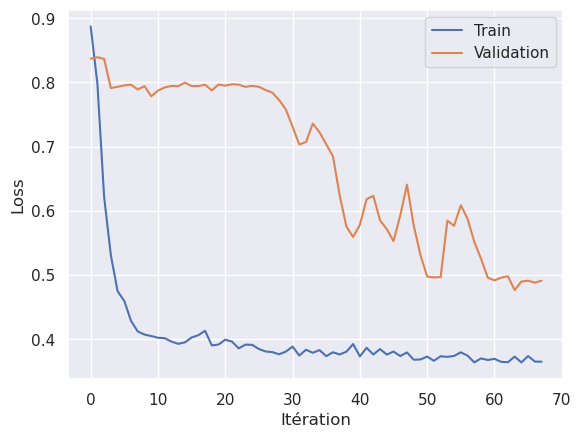

In [34]:
plt.plot(result_2.index[start:], result_2["loss"][start:])
plt.plot(result_2.index[start:], result_2["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


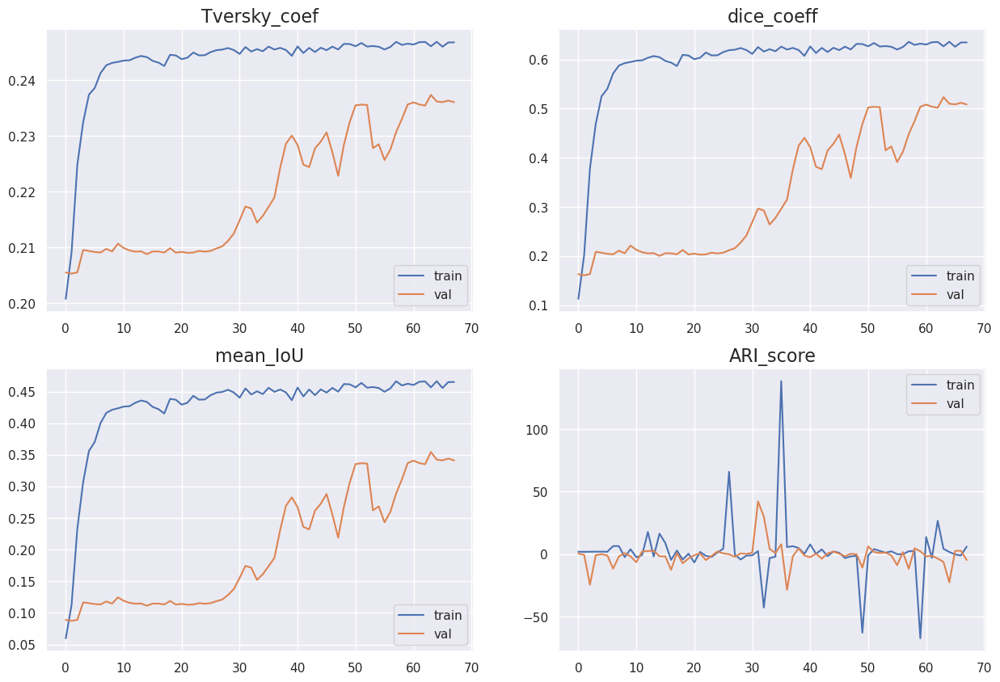

In [35]:
afficher_les_metriques( result_2 )

In [36]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_2, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [37]:
img.shape

(50, 128, 256, 3)

In [38]:
mask.shape

(50, 128, 256, 8)

In [39]:
mask_pred = model_2.predict(img)

2/2 [==============================] - 5s 2s/step


In [40]:
mask_pred.shape

(50, 128, 256, 8)

In [41]:
transformer = Mask_To_8_Groups()

In [42]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred]

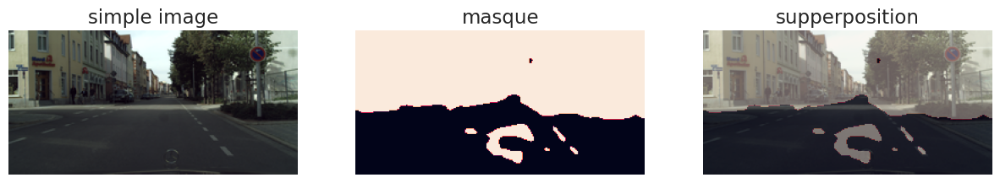

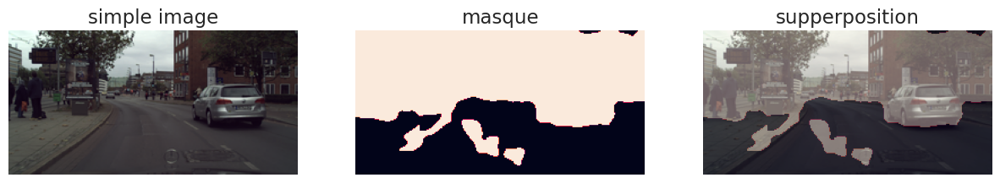

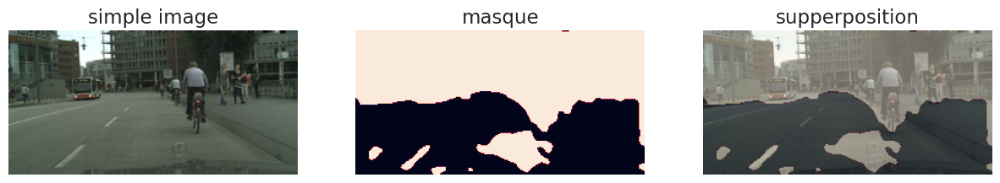

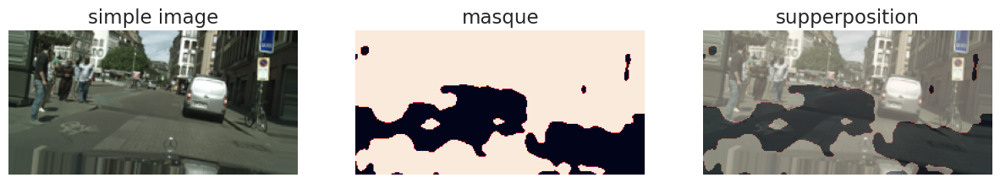

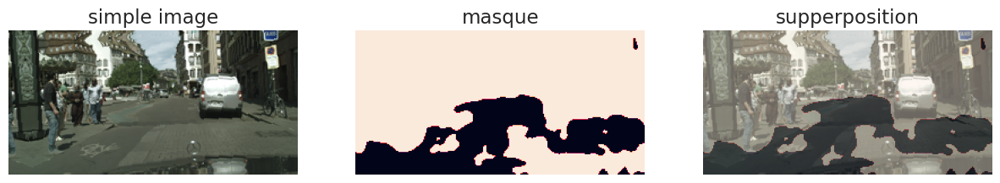

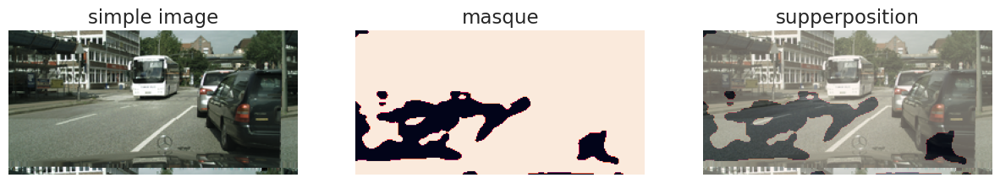

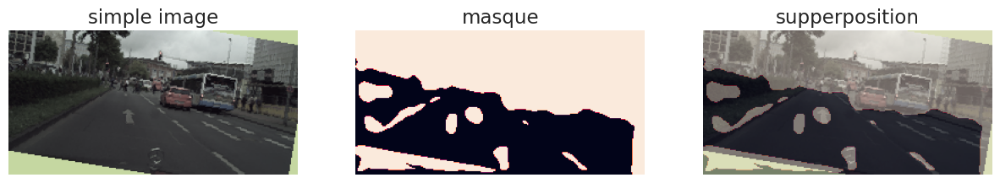

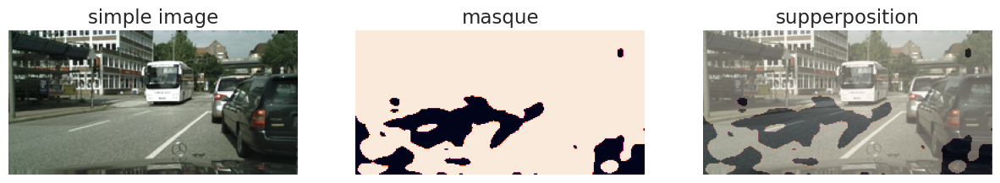

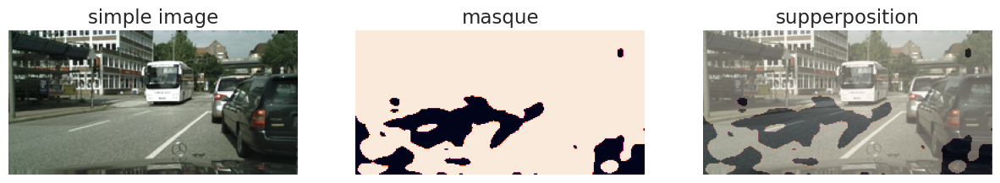

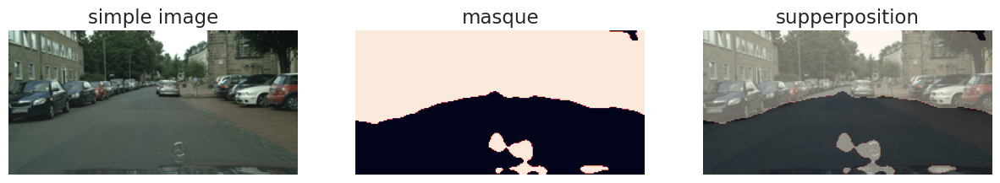

In [43]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

# <strong> C - Sans augmentation de données avec fonction perte de type categorical_focal_loss

In [44]:
#resolution des images et masques
aug_3 = True
perte_3 = "categorical_focal_loss"
img_res = (128,256,3)

In [45]:
model_3 = TL_unet_model( img_res , 8)

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 128, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 128, 256, 64  1792        ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 128, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

In [46]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_3.compile(optimizer = Adam(lr = 2.e-2),
                loss = categorical_focal_loss ,
                metrics = [ARI_score, mean_IoU,dice_coeff, Tversky_coef ],
                run_eagerly=True 
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_3 = f"models/{model_name}_Loss={perte_3}_aug={aug_3}_/cp.ckpt"
checkpoint_dir_3 = os.path.dirname(checkpoint_path_3)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.85)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_3 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_3,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq = 125
                                                  )
early_stopping_3 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=10,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_3 = False

In [47]:
if charger_les_poids_3 :
    model_3.load_weights(checkpoint_path_3)
    

history_3 = model_3.fit_generator( 
    generator= MyImagesGenerator(chemin_image, chemin_masque_labelIds,25, True, augmentation=aug_3, taille_des_donnees= 10, target_size=img_res),
    validation_data= MyImagesGenerator(chemin_image, chemin_masque_labelIds,5, True, augmentation=aug_3, taille_des_donnees= 4, target_size=img_res),
    epochs= 450,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_3, early_stopping_3 ],
    max_queue_size=12,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_3.save(checkpoint_dir_3+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")

Epoch 1/450
1/1 [==============================] - 24s 24s/step - loss: 0.0615 - ARI_score: 2.0704 - mean_IoU: 0.0589 - dice_coeff: 0.1112 - Tversky_coef: 0.2010 - val_loss: 0.3516 - val_ARI_score: -1.3747 - val_mean_IoU: 0.1759 - val_dice_coeff: 0.2992 - val_Tversky_coef: 0.2171 - lr: 0.0200
Epoch 2/450
1/1 [==============================] - 23s 23s/step - loss: 0.0519 - ARI_score: 2.4548 - mean_IoU: 0.1037 - dice_coeff: 0.1879 - Tversky_coef: 0.2082 - val_loss: 0.4093 - val_ARI_score: -13.5660 - val_mean_IoU: 0.0656 - val_dice_coeff: 0.1231 - val_Tversky_coef: 0.2016 - lr: 0.0200
Epoch 3/450
1/1 [==============================] - 23s 23s/step - loss: 0.0387 - ARI_score: 1.8530 - mean_IoU: 0.1520 - dice_coeff: 0.2639 - Tversky_coef: 0.2153 - val_loss: 0.4499 - val_ARI_score: -1.9860 - val_mean_IoU: 0.0383 - val_dice_coeff: 0.0738 - val_Tversky_coef: 0.1972 - lr: 0.0200
Epoch 4/450
1/1 [==============================] - 23s 23s/step - loss: 0.0344 - ARI_score: 2.4548 - mean_IoU: 0.1995

In [48]:
result_3  = pd.DataFrame( history_3.history )
result_3.drop(["lr"], axis = 1, inplace = True)
result_3["modèle"] = [model_name for _ in range( result_3.shape[0])]
result_3["Loss"] = [perte_3 for _ in range( result_3.shape[0])]
result_3["Augmentation"] = [aug_3 for _ in range( result_3.shape[0])]
result_3.to_csv(f"{model_name}_loss={perte_3}_augment={aug_3}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index=False)
result_3

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.061527,2.070417,0.058858,0.111173,0.200982,0.351562,-1.374666,0.175894,0.299166,0.217100,Transfert_learning_UNET+augmentation,categorical_focal_loss,True
1,0.051941,2.454789,0.103712,0.187934,0.208154,0.409290,-13.566018,0.065569,0.123068,0.201565,Transfert_learning_UNET+augmentation,categorical_focal_loss,True
2,0.038697,1.853002,0.151991,0.263875,0.215277,0.449899,-1.985958,0.038315,0.073801,0.197209,Transfert_learning_UNET+augmentation,categorical_focal_loss,True
3,0.034423,2.454789,0.199511,0.332654,0.221383,0.467830,-1.320327,0.034350,0.066417,0.196556,Transfert_learning_UNET+augmentation,categorical_focal_loss,True
4,0.032792,1.867600,0.190811,0.320472,0.220345,0.475614,4.666680,0.022836,0.044652,0.194617,Transfert_learning_UNET+augmentation,categorical_focal_loss,True
5,0.028556,3.431571,0.175004,0.297878,0.218424,0.492241,7.235068,0.007484,0.014857,0.192020,Transfert_learning_UNET+augmentation,categorical_focal_loss,True
6,0.028242,1.897994,0.164813,0.282986,0.217084,0.492408,-4.981318,0.007047,0.013995,0.191940,Transfert_learning_UNET+augmentation,categorical_focal_loss,True
7,0.026393,2.149264,0.180515,0.305823,0.219186,0.490729,-1.201678,0.008394,0.016647,0.192163,Transfert_learning_UNET+augmentation,categorical_focal_loss,True
8,0.025470,1.355608,0.206187,0.341882,0.222429,0.488087,7.124490,0.009967,0.019737,0.192419,Transfert_learning_UNET+augmentation,categorical_focal_loss,True
9,0.023168,2.066885,0.245049,0.393638,0.227041,0.488339,-0.333524,0.008875,0.017594,0.192247,Transfert_learning_UNET+augmentation,categorical_focal_loss,True


In [49]:
start = 3

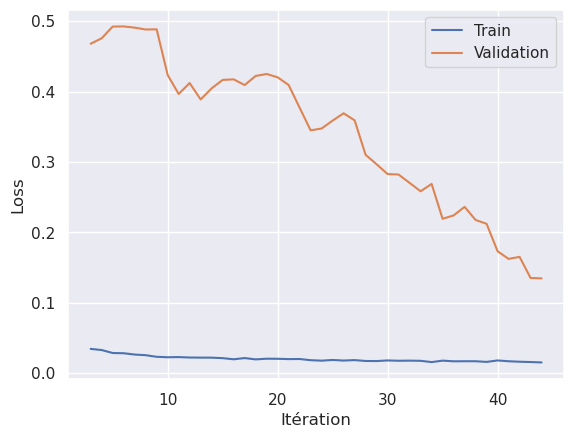

In [50]:
plt.plot(result_3.index[start:], result_3["loss"][start:])
plt.plot(result_3.index[start:], result_3["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


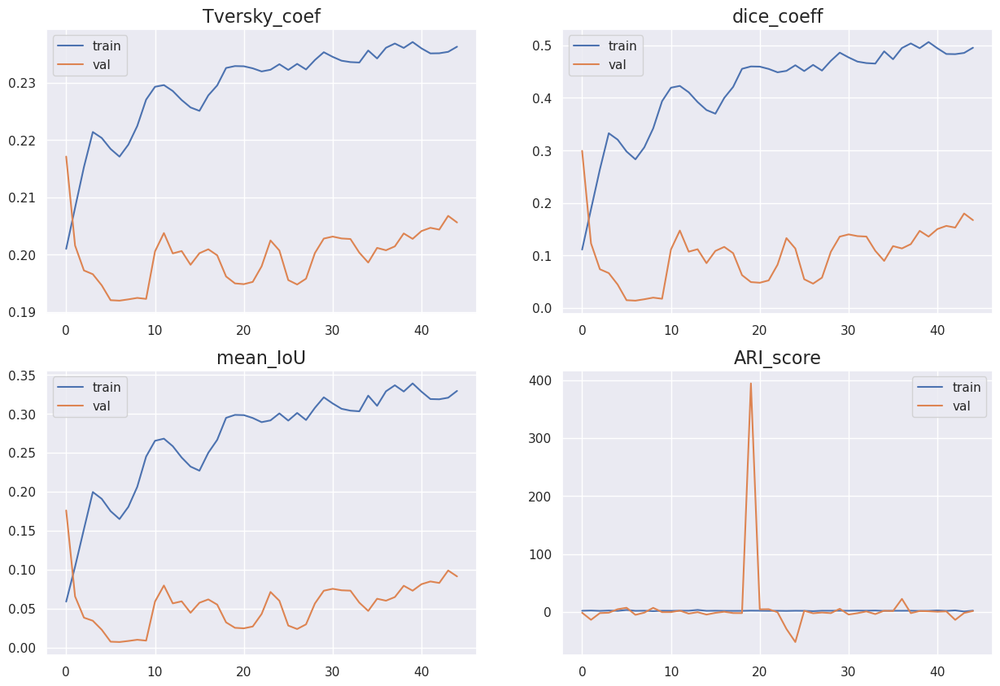

In [51]:
afficher_les_metriques( result_3 )

In [52]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_3, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [53]:
img.shape

(50, 128, 256, 3)

In [54]:
mask.shape

(50, 128, 256, 8)

In [55]:
mask_pred = model_3.predict(img)

2/2 [==============================] - 5s 2s/step


In [56]:
mask_pred.shape

(50, 128, 256, 8)

In [57]:
transformer = Mask_To_8_Groups()

In [58]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred]

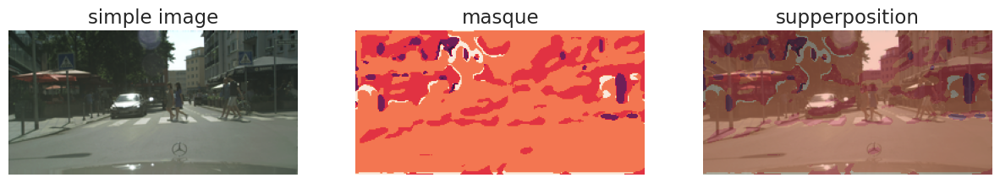

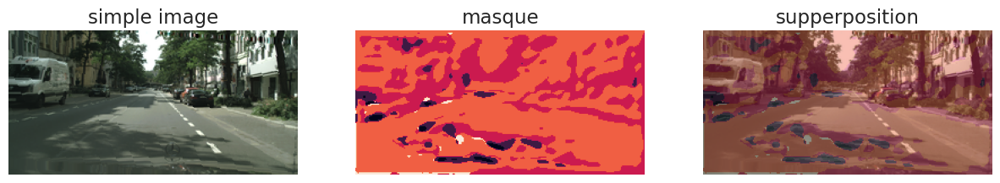

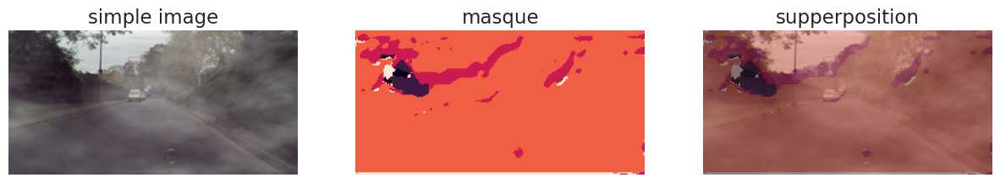

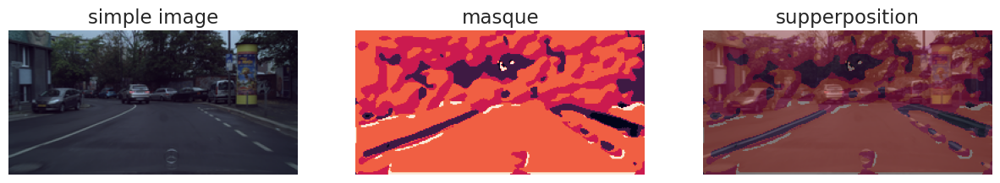

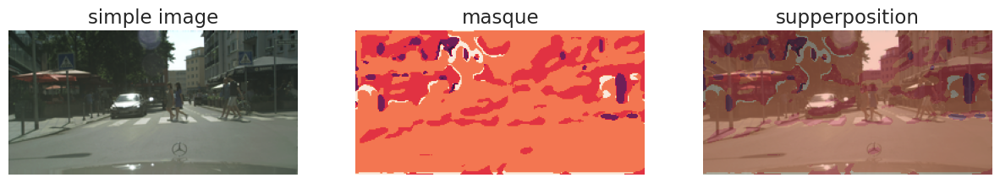

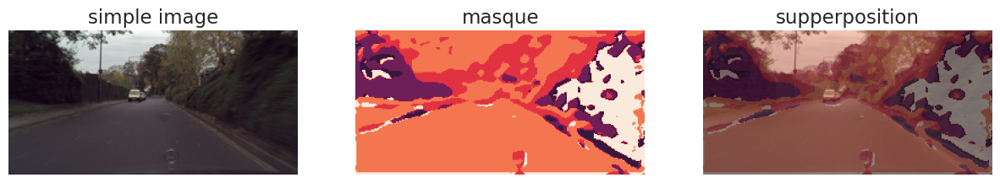

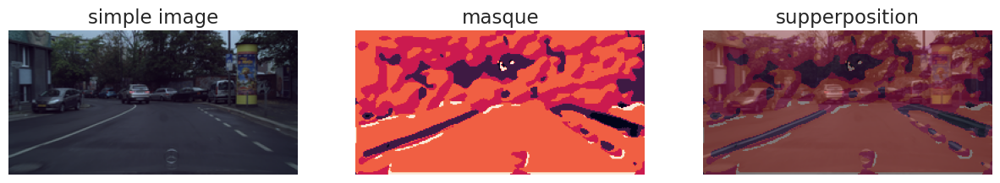

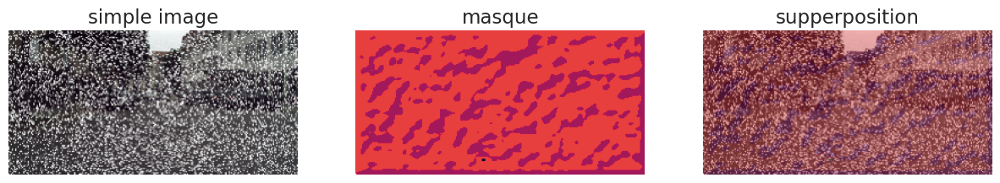

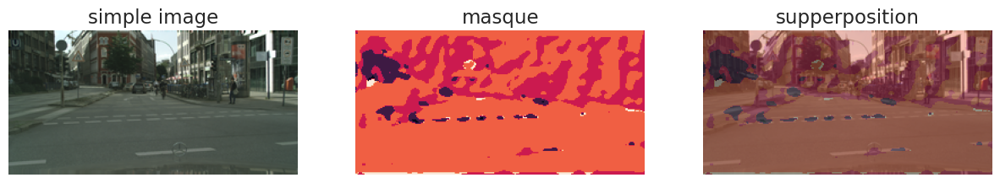

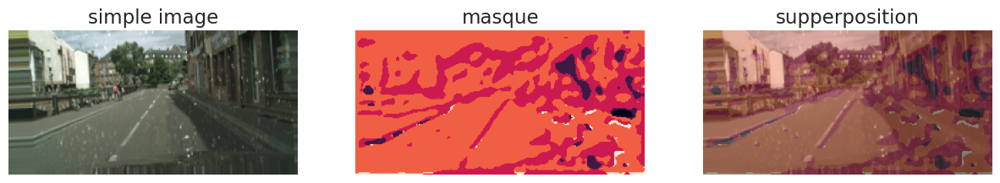

In [59]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

# <strong> D - Sans augmentation de données avec fonction perte de type categorical_focal_jaccard_loss

In [60]:
#resolution des images et masques
aug_4 = True
perte_4 = "categorical_focal_jaccard_loss"
img_res = (128,256,3)

In [61]:
model_4 = TL_unet_model( img_res , 8)

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 128, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 128, 256, 64  1792        ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 128, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

In [62]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_4.compile(optimizer = Adam(lr = 2.e-2 ),
                loss = categorical_focal_jaccard_loss ,
                metrics = [ARI_score, mean_IoU, dice_coeff, Tversky_coef ],
                run_eagerly=True
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_4 = f"models/{model_name}_Loss={perte_4}_aug={aug_4}_/cp.ckpt"
checkpoint_dir_4 = os.path.dirname(checkpoint_path_4)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.85)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_4 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_4,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq = 125
                                                  )
early_stopping_4 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=15,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_4 = False

In [63]:
if charger_les_poids_4  :
    model_4.load_weights(checkpoint_path_4)
    
    
history_4 = model_4.fit_generator( 
    generator= MyImagesGenerator(chemin_image, chemin_masque_labelIds,25, True, augmentation=aug_4, taille_des_donnees= 10, target_size=img_res),
    validation_data= MyImagesGenerator(chemin_image, chemin_masque_labelIds,5, True, augmentation=aug_4, taille_des_donnees= 4, target_size=img_res),
    epochs= 450,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_4, early_stopping_4 ] ,
    max_queue_size=12,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_4.save(checkpoint_dir_4+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")

Epoch 1/450
1/1 [==============================] - 24s 24s/step - loss: 1.0152 - ARI_score: 1.9828 - mean_IoU: 0.0574 - dice_coeff: 0.1085 - Tversky_coef: 0.2008 - val_loss: 1.4260 - val_ARI_score: 12.9788 - val_mean_IoU: 0.0644 - val_dice_coeff: 0.1209 - val_Tversky_coef: 0.2017 - lr: 0.0200
Epoch 2/450
1/1 [==============================] - 23s 23s/step - loss: 0.9690 - ARI_score: 1.9835 - mean_IoU: 0.1164 - dice_coeff: 0.2085 - Tversky_coef: 0.2101 - val_loss: 1.3545 - val_ARI_score: -2.2659 - val_mean_IoU: 0.1336 - val_dice_coeff: 0.2358 - val_Tversky_coef: 0.2119 - lr: 0.0200
Epoch 3/450
1/1 [==============================] - 23s 23s/step - loss: 0.9388 - ARI_score: 1.9811 - mean_IoU: 0.1900 - dice_coeff: 0.3193 - Tversky_coef: 0.2204 - val_loss: 1.3524 - val_ARI_score: -6.6927 - val_mean_IoU: 0.1363 - val_dice_coeff: 0.2400 - val_Tversky_coef: 0.2122 - lr: 0.0200
Epoch 4/450
1/1 [==============================] - 24s 24s/step - loss: 0.9102 - ARI_score: 1.9826 - mean_IoU: 0.2699 

In [64]:
result_4  = pd.DataFrame( history_4.history )
result_4.drop(["lr"], axis = 1, inplace = True)
result_4["modèle"] = [model_name for _ in range( result_4.shape[0])]
result_4["Loss"] = [perte_4 for _ in range( result_4.shape[0])]
result_4["Augmentation"] = [aug_4 for _ in range( result_4.shape[0])]
result_4.to_csv(f"{model_name}_loss={perte_4}_augment={aug_4}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index=False)
result_4

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,1.015231,1.982831,0.057376,0.108525,0.200753,1.425968,12.978762,0.064364,0.120944,0.201727,Transfert_learning_UNET+augmentation,categorical_focal_jaccard_loss,True
1,0.968991,1.983470,0.116357,0.208458,0.210148,1.354488,-2.265895,0.133628,0.235751,0.211866,Transfert_learning_UNET+augmentation,categorical_focal_jaccard_loss,True
2,0.938835,1.981130,0.190009,0.319341,0.220370,1.352394,-6.692747,0.136349,0.239976,0.212239,Transfert_learning_UNET+augmentation,categorical_focal_jaccard_loss,True
3,0.910195,1.982607,0.269887,0.425057,0.229463,1.354730,15.820347,0.132054,0.233299,0.211651,Transfert_learning_UNET+augmentation,categorical_focal_jaccard_loss,True
4,0.884620,1.983870,0.296379,0.457242,0.232182,1.483106,-6.265237,0.011741,0.023209,0.193094,Transfert_learning_UNET+augmentation,categorical_focal_jaccard_loss,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
117,0.379663,1.821314,0.794569,0.885526,0.269414,1.370952,-0.766633,0.083265,0.153729,0.204634,Transfert_learning_UNET+augmentation,categorical_focal_jaccard_loss,True
118,0.359982,-1.922216,0.809457,0.894696,0.270219,1.359267,1.803989,0.092267,0.168945,0.205985,Transfert_learning_UNET+augmentation,categorical_focal_jaccard_loss,True
119,0.407354,4.594953,0.767777,0.868635,0.267918,1.338840,-7.340144,0.101996,0.185110,0.207409,Transfert_learning_UNET+augmentation,categorical_focal_jaccard_loss,True
120,0.370852,-1.332541,0.798330,0.887857,0.269613,1.311284,-0.625363,0.117805,0.210779,0.209689,Transfert_learning_UNET+augmentation,categorical_focal_jaccard_loss,True


In [65]:
start = 0

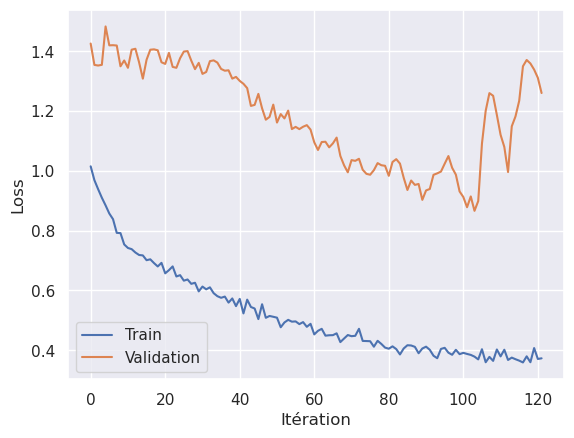

In [66]:
plt.plot(result_4.index[start:], result_4["loss"][start:])
plt.plot(result_4.index[start:], result_4["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


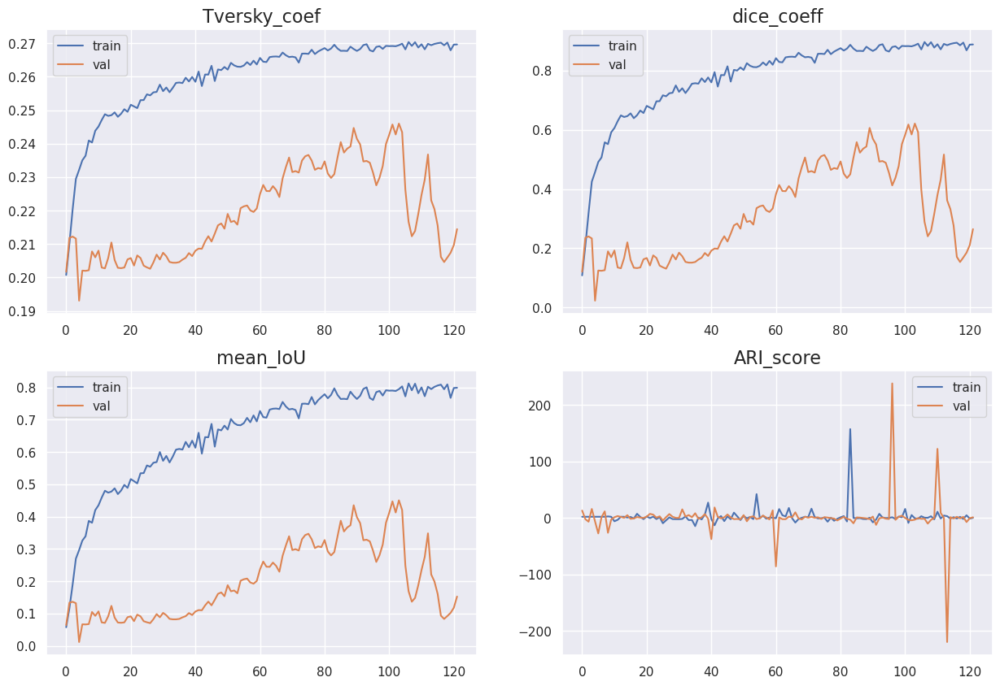

In [67]:
afficher_les_metriques( result_4 )

In [68]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, False, augmentation=aug_4, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [69]:
img.shape

(50, 128, 256, 3)

In [70]:
mask.shape

(50, 128, 256, 8)

In [71]:
mask_pred = model_4.predict(img)

2/2 [==============================] - 5s 2s/step


In [72]:
mask_pred.shape

(50, 128, 256, 8)

In [73]:
transformer = Mask_To_8_Groups()

In [74]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred]

In [75]:
np.unique( mask_pred )

array([0, 1, 2, 3, 4, 5, 6, 7])

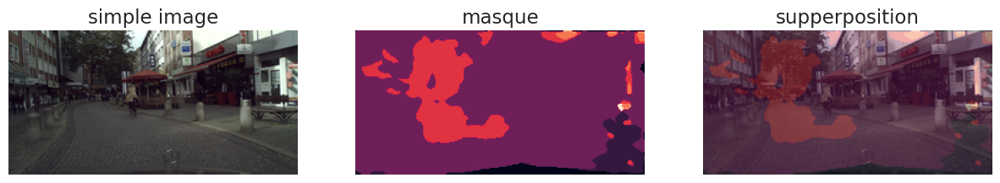

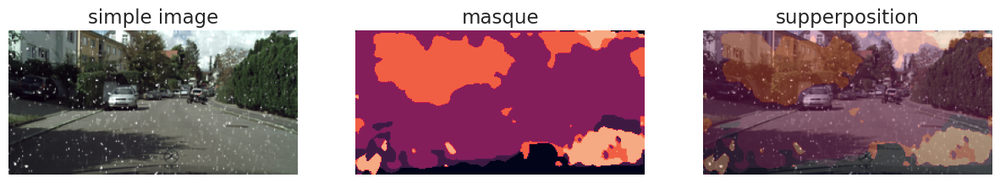

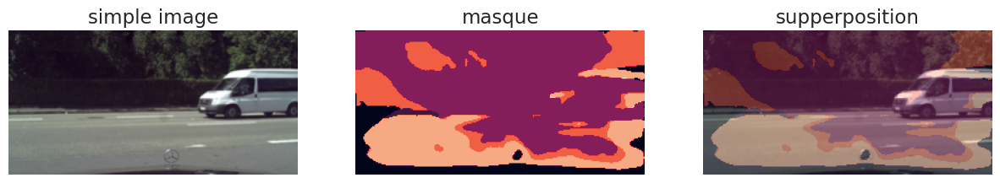

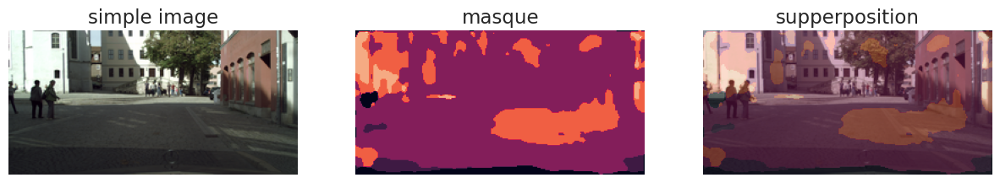

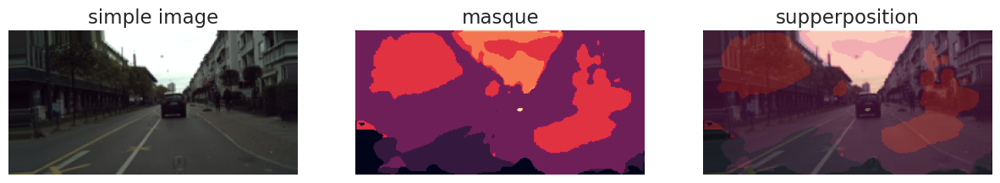

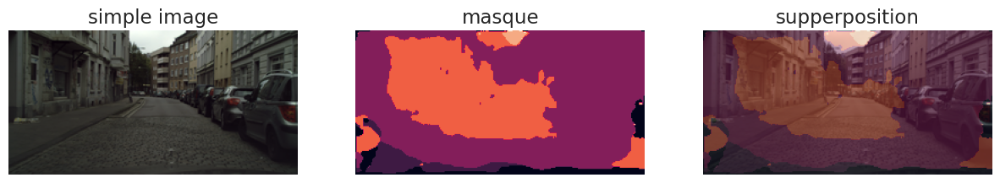

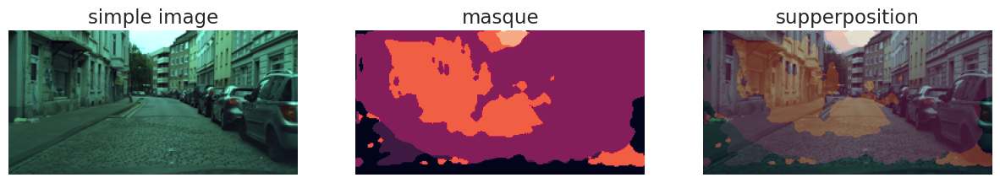

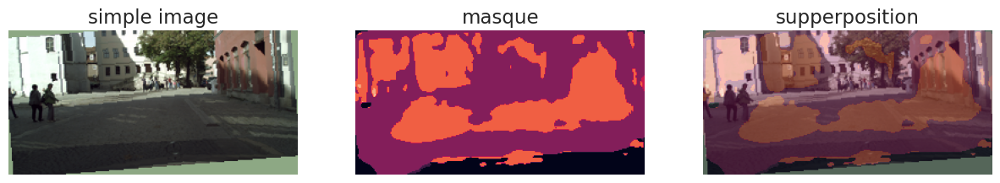

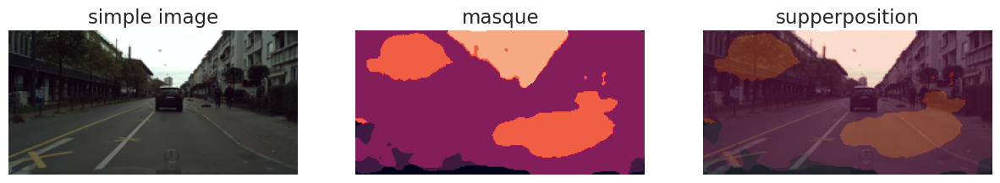

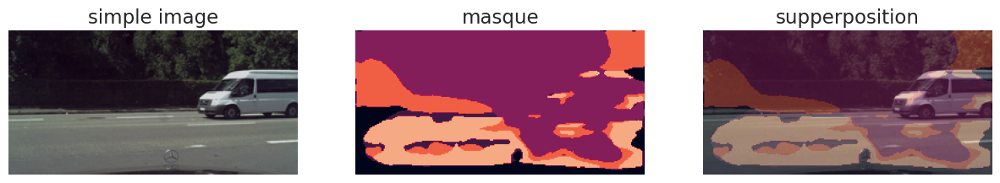

In [76]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

# <strong> E - Sans augmentation de données avec fonction perte de type categorical_focal_dice_loss

In [77]:
#resolution des images et masques
aug_5 = True
perte_5 = "categorical_focal_dice_loss"
img_res = (128,256,3)

In [78]:
model_5 = TL_unet_model( img_res , 8)

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 128, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 128, 256, 64  1792        ['input_5[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 128, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

In [79]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_5.compile(optimizer = Adam(lr = 2.e-2 ),
                loss = categorical_focal_dice_loss ,
                metrics = [ARI_score, mean_IoU, dice_coeff, Tversky_coef ],
                run_eagerly=True
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_5 = f"models/{model_name}_Loss={perte_5}_aug={aug_5}_/cp.ckpt"
checkpoint_dir_5 = os.path.dirname(checkpoint_path_5)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.85)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_5 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_5,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq = 125
                                                  )
early_stopping_5 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=15,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_5 = False

In [80]:
if charger_les_poids_5  :
    model_5.load_weights(checkpoint_path_5)
    
    
history_5 = model_5.fit_generator( 
    generator= MyImagesGenerator(chemin_image, chemin_masque_labelIds,25, True, augmentation=aug_5, taille_des_donnees= 10, target_size=img_res),
    validation_data= MyImagesGenerator(chemin_image, chemin_masque_labelIds,5, True, augmentation=aug_5, taille_des_donnees= 4, target_size=img_res),
    epochs= 450,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_5, early_stopping_5 ] ,
    max_queue_size=12,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_5.save(checkpoint_dir_5+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")

Epoch 1/450
1/1 [==============================] - 25s 25s/step - loss: 0.9505 - ARI_score: 2.0150 - mean_IoU: 0.0750 - dice_coeff: 0.1395 - Tversky_coef: 0.2036 - val_loss: 1.3962 - val_ARI_score: -1.1409 - val_mean_IoU: 0.0738 - val_dice_coeff: 0.1375 - val_Tversky_coef: 0.2031 - lr: 0.0200
Epoch 2/450
1/1 [==============================] - 25s 25s/step - loss: 0.9063 - ARI_score: 2.0152 - mean_IoU: 0.1195 - dice_coeff: 0.2135 - Tversky_coef: 0.2106 - val_loss: 1.3543 - val_ARI_score: 0.6791 - val_mean_IoU: 0.0995 - val_dice_coeff: 0.1809 - val_Tversky_coef: 0.2069 - lr: 0.0200
Epoch 3/450
1/1 [==============================] - 25s 25s/step - loss: 0.8623 - ARI_score: 2.0127 - mean_IoU: 0.1789 - dice_coeff: 0.3035 - Tversky_coef: 0.2188 - val_loss: 1.3841 - val_ARI_score: 0.3082 - val_mean_IoU: 0.0599 - val_dice_coeff: 0.1130 - val_Tversky_coef: 0.2009 - lr: 0.0200
Epoch 4/450
1/1 [==============================] - 25s 25s/step - loss: 0.7963 - ARI_score: 2.0143 - mean_IoU: 0.2482 - 

In [81]:
result_5  = pd.DataFrame( history_5.history )
result_5.drop(["lr"], axis = 1, inplace = True)
result_5["modèle"] = [model_name for _ in range( result_5.shape[0])]
result_5["Loss"] = [perte_5 for _ in range( result_5.shape[0])]
result_5["Augmentation"] = [aug_5 for _ in range( result_5.shape[0])]
result_5.to_csv(f"{model_name}_loss={perte_5}_augment={aug_5}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index=False)
result_5

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.950495,2.014990,0.074952,0.139451,0.203641,1.396246,-1.140859,0.073815,0.137482,0.203105,Transfert_learning_UNET+augmentation,categorical_focal_dice_loss,True
1,0.906330,2.015161,0.119522,0.213524,0.210593,1.354298,0.679129,0.099454,0.180915,0.206936,Transfert_learning_UNET+augmentation,categorical_focal_dice_loss,True
2,0.862276,2.012704,0.178873,0.303464,0.218792,1.384101,0.308177,0.059876,0.112987,0.200947,Transfert_learning_UNET+augmentation,categorical_focal_dice_loss,True
3,0.796273,2.014345,0.248180,0.397667,0.226902,1.402546,-0.032017,0.048039,0.091674,0.199069,Transfert_learning_UNET+augmentation,categorical_focal_dice_loss,True
4,0.747976,2.015513,0.288858,0.448238,0.231322,1.331557,4.330375,0.117526,0.210332,0.209532,Transfert_learning_UNET+augmentation,categorical_focal_dice_loss,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
182,0.180404,4.304565,0.849386,0.918560,0.272278,0.486849,-3.485530,0.587909,0.740481,0.256454,Transfert_learning_UNET+augmentation,categorical_focal_dice_loss,True
183,0.188764,3.300411,0.837753,0.911714,0.271672,0.504710,-2.414705,0.547930,0.707951,0.253601,Transfert_learning_UNET+augmentation,categorical_focal_dice_loss,True
184,0.187193,-3.220290,0.842709,0.914641,0.271931,0.516441,-2.212113,0.536484,0.698327,0.252760,Transfert_learning_UNET+augmentation,categorical_focal_dice_loss,True
185,0.192835,3.903558,0.836433,0.910932,0.271604,0.516932,23.130651,0.551015,0.710522,0.253828,Transfert_learning_UNET+augmentation,categorical_focal_dice_loss,True


In [82]:
start = 0

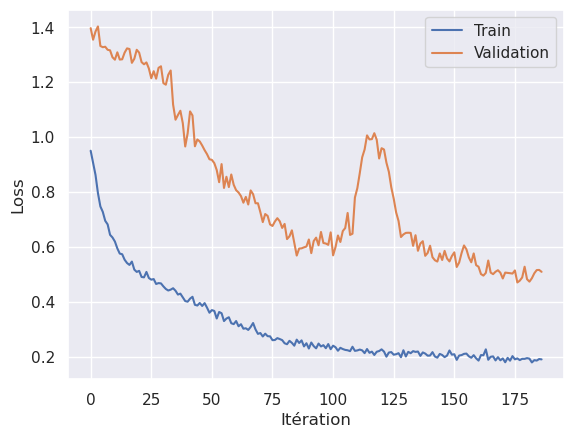

In [83]:
plt.plot(result_5.index[start:], result_5["loss"][start:])
plt.plot(result_5.index[start:], result_5["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


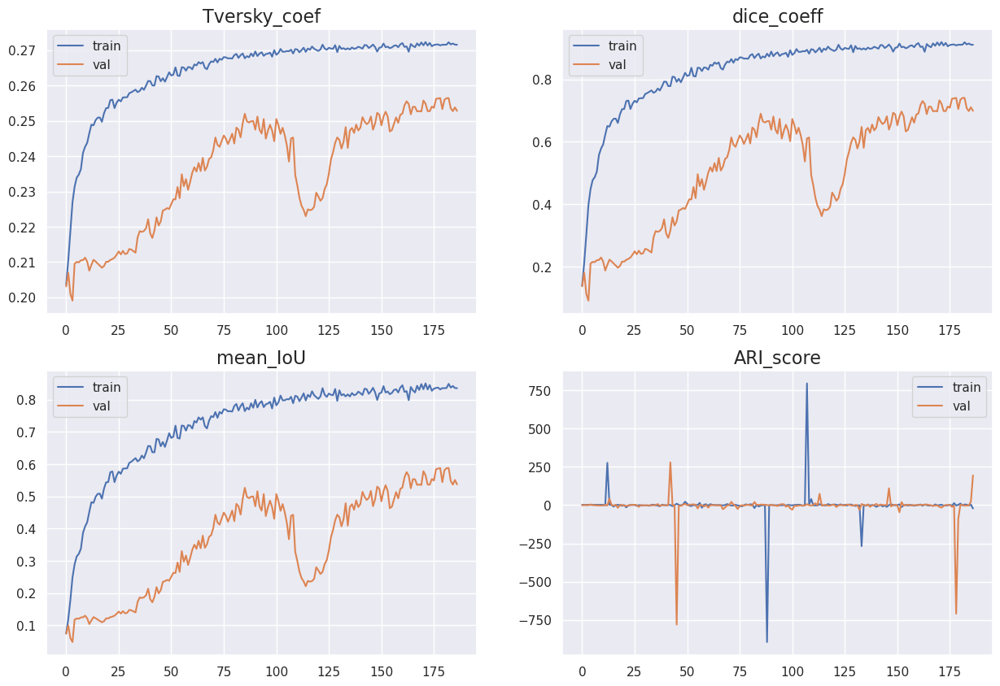

In [84]:
afficher_les_metriques( result_5 )

In [85]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, False, augmentation=aug_5, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [86]:
img.shape

(50, 128, 256, 3)

In [87]:
mask.shape

(50, 128, 256, 8)

In [88]:
mask_pred = model_5.predict(img)

2/2 [==============================] - 5s 2s/step


In [89]:
mask_pred.shape

(50, 128, 256, 8)

In [90]:
transformer = Mask_To_8_Groups()

In [91]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred]

In [92]:
np.unique( mask_pred )

array([0, 1, 2, 3, 4, 5, 6, 7])

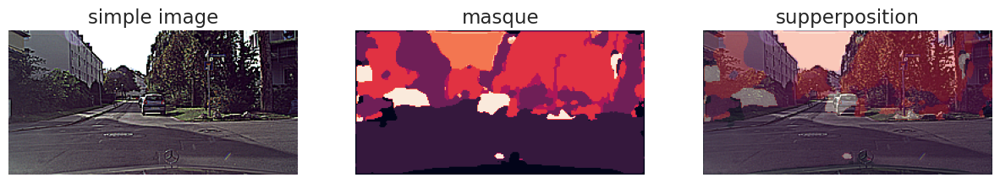

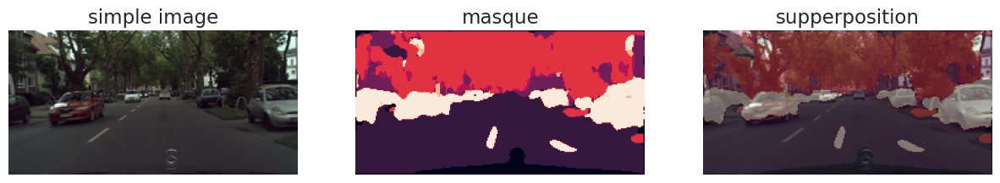

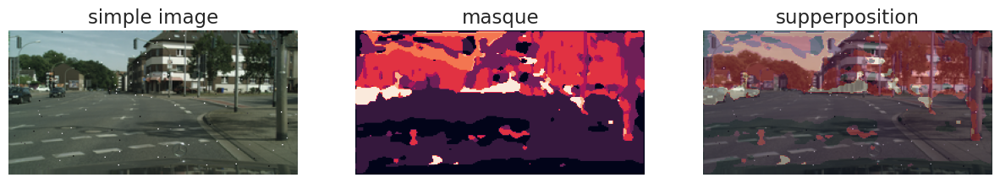

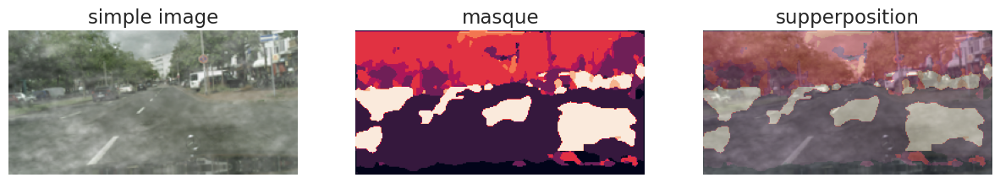

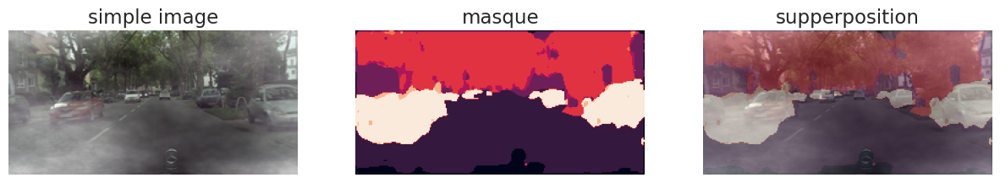

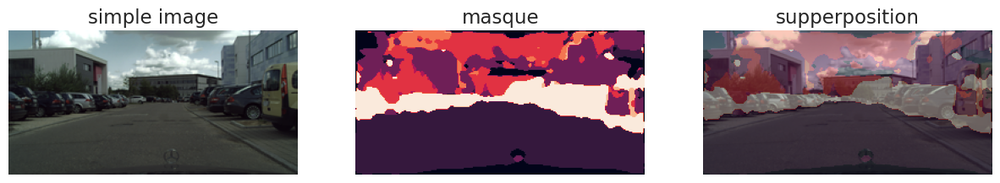

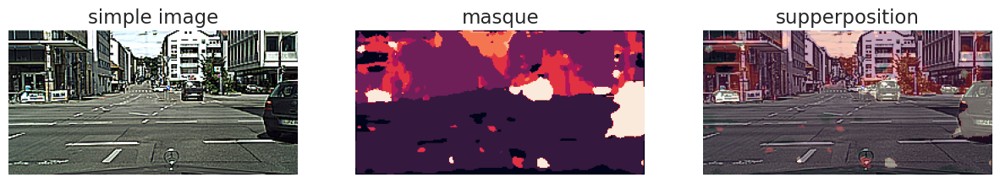

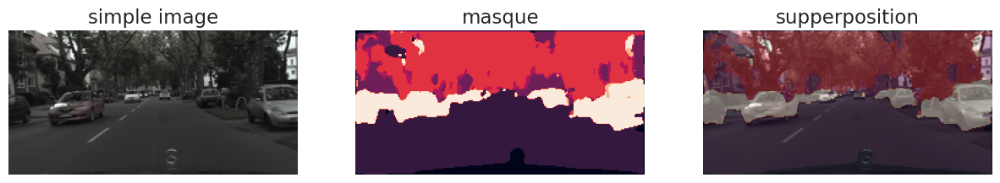

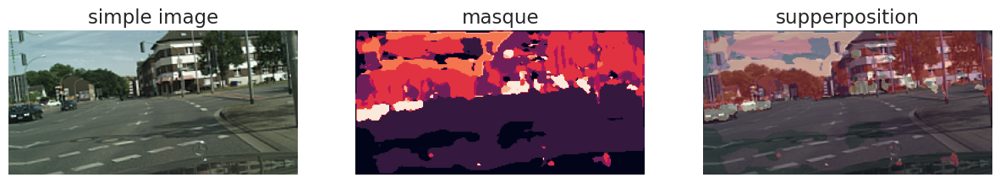

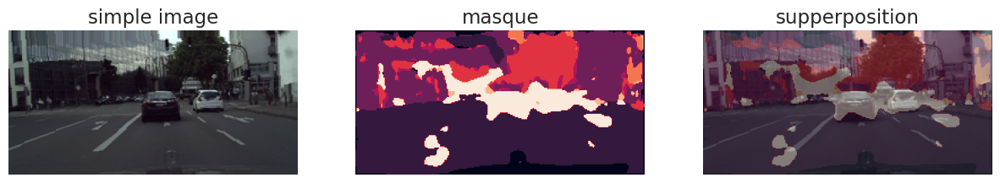

In [93]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

In [94]:
recap = pd.DataFrame([result_1.iloc[-result_1.shape[0]//2:,:].max().values , 
                      result_2.iloc[-result_2.shape[0]//2:,:].max().values,
                      result_3.iloc[-result_3.shape[0]//2:,:].max().values, 
                      result_4.iloc[-result_4.shape[0]//2:,:].max().values,
                      result_5.iloc[-result_5.shape[0]//2:,:].max().values
                     ],
                     columns= result_1.keys()
                    ).drop(["loss","ARI_score","val_ARI_score","val_loss"], axis = 1)

recap

,mean_IoU,dice_coeff,Tversky_coef,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.773399,0.872222,0.268073,0.462624,0.632595,0.246863,Transfert_learning_UNET+augmentation,jaccard_loss,True
1,0.466391,0.636108,0.246872,0.354483,0.523422,0.237347,Transfert_learning_UNET+augmentation,dice_loss,True
2,0.338915,0.506253,0.237092,0.098838,0.179894,0.206745,Transfert_learning_UNET+augmentation,categorical_focal_loss,True
3,0.812566,0.896592,0.270383,0.450551,0.621213,0.246004,Transfert_learning_UNET+augmentation,categorical_focal_jaccard_loss,True
4,0.850707,0.919332,0.272344,0.587909,0.740481,0.256467,Transfert_learning_UNET+augmentation,categorical_focal_dice_loss,True


In [95]:
recap.style.highlight_min(axis=0, color='red').highlight_max(axis=0, color='green')

,mean_IoU,dice_coeff,Tversky_coef,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.773399,0.872222,0.268073,0.462624,0.632595,0.246863,Transfert_learning_UNET+augmentation,jaccard_loss,True
1,0.466391,0.636108,0.246872,0.354483,0.523422,0.237347,Transfert_learning_UNET+augmentation,dice_loss,True
2,0.338915,0.506253,0.237092,0.098838,0.179894,0.206745,Transfert_learning_UNET+augmentation,categorical_focal_loss,True
3,0.812566,0.896592,0.270383,0.450551,0.621213,0.246004,Transfert_learning_UNET+augmentation,categorical_focal_jaccard_loss,True
4,0.850707,0.919332,0.272344,0.587909,0.740481,0.256467,Transfert_learning_UNET+augmentation,categorical_focal_dice_loss,True


In [96]:
#if "recap.csv" in os.listdir() : 
#    x = pd.read_csv("recep.csv")
#    recap = pd.concat([x , recap], axis = 0, ignore_index=True)
#    recap.drop_duplicates(["modèle","Loss","Augmentation"], inplace=True)

recap.to_csv(f"recap_{model_name}.csv", index = False)
